In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python

import io # Input/Output Module
import os # OS interfaces
import cv2 # OpenCV package
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import random

from urllib import request # module for opening HTTP requests
from matplotlib import pyplot as plt # Plotting library

random_seed = 42 # So we have reproducible results with classifiers

When testing locally, we found that there was some randomness due to some classifiers using a random seed, RandomForest being one such classifier. Therefore, a seed was set so that when testing was consistent and improvements could be more easily tracked.

<div style="width:100%; height:140px">
    <img src="https://www.kuleuven.be/internationaal/thinktank/fotos-en-logos/ku-leuven-logo.png/image_preview" width = 300px, heigh = auto align=left>
</div>

KUL H02A5a Computer Vision: Group Assignment 1
---------------------------------------------------------------
Student numbers: <span style="color:red">r0755132, r0977191, r0978907, r0978720, r0754877</span>.

The goal of this assignment is to explore more advanced techniques for constructing features that better describe objects of interest and to perform face recognition using these features. This assignment will be delivered in groups of 5 (either composed by you or randomly assigned by your TA's).

In this assignment you are a group of computer vision experts that have been invited to ECCV 2021 to do a tutorial about  "Feature representations, then and now". To prepare the tutorial you are asked to participate in a kaggle competition and to release a notebook that can be easily studied by the tutorial participants. Your target audience is: (master) students who want to get a first hands-on introduction to the techniques that you apply.

---------------------------------------------------------------
This notebook is structured as follows:
0. Data loading & Preprocessing
1. Feature Representations
2. Evaluation Metrics 
3. Classifiers
4. Experiments
5. Publishing best results
6. Discussion

Make sure that your notebook is **self-contained** and **fully documented**. Walk us through all steps of your code. Treat your notebook as a tutorial for students who need to get a first hands-on introduction to the techniques that you apply. Provide strong arguments for the design choices that you made and what insights you got from your experiments. Make use of the *Group assignment* forum/discussion board on Toledo if you have any questions.

Fill in your student numbers above and get to it! Good luck! 


<div class="alert alert-block alert-info">
<b>NOTE:</b> This notebook is just a example/template, feel free to adjust in any way you please! Just keep things organised and document accordingly!
</div>

<div class="alert alert-block alert-info">
<b>NOTE:</b> Clearly indicate the improvements that you make!!! You can for instance use titles like: <i>3.1. Improvement: Non-linear SVM with RBF Kernel.<i>
</div>
    
---------------------------------------------------------------
# 0. Data loading & Preprocessing

## 0.1. Loading data
The training set is many times smaller than the test set and this might strike you as odd, however, this is close to a real world scenario where your system might be put through daily use! In this session we will try to do the best we can with the data that we've got! 

In [2]:
# Input data files are available in the read-only "../input/" directory

train = pd.read_csv(
    '/kaggle/input/kul-h02a5a-computer-vision-ga1-2024/train_set.csv', index_col = 0)
train.index = train.index.rename('id')

test = pd.read_csv(
    '/kaggle/input/kul-h02a5a-computer-vision-ga1-2024/test_set.csv', index_col = 0)
test.index = test.index.rename('id')

# read the images as numpy arrays and store in "img" column
train['img'] = [cv2.cvtColor(np.load('/kaggle/input/kul-h02a5a-computer-vision-ga1-2024/train/train_{}.npy'.format(index), allow_pickle=False), cv2.COLOR_BGR2RGB) 
                for index, row in train.iterrows()]

test['img'] = [cv2.cvtColor(np.load('/kaggle/input/kul-h02a5a-computer-vision-ga1-2024/test/test_{}.npy'.format(index), allow_pickle=False), cv2.COLOR_BGR2RGB) 
                for index, row in test.iterrows()]
  

train_size, test_size = len(train),len(test)

"The training set contains {} examples, the test set contains {} examples.".format(train_size, test_size)

'The training set contains 80 examples, the test set contains 1816 examples.'

*Note: this dataset is a subset of the* [*VGG face dataset*](https://www.robots.ox.ac.uk/~vgg/data/vgg_face/).

## 0.2. A first look
Let's have a look at the data columns and class distribution.

In [3]:
# The training set contains an identifier, name, image information and class label
train.head(1)

,name,class,img
id,,,
0,Mila_Kunis,2,"[[[50, 31, 25], [49, 30, 24], [49, 30, 24], [4..."


In [4]:
# The test set only contains an identifier and corresponding image information.

test.head(1)

,img
id,
0,"[[[209, 210, 205], [208, 209, 204], [208, 209,..."


In [5]:
# The class distribution in the training set:
train.groupby('name').agg({'img':'count', 'class': 'max'})

,img,class
name,,
Jesse_Eisenberg,30,1
Michael_Cera,10,0
Mila_Kunis,30,2
Sarah_Hyland,10,0


Note that **Jesse is assigned the classification label 1**, and **Mila is assigned the classification label 2**. The dataset also contains 20 images of **look alikes (assigned classification label 0)** and the raw images. 

## 0.3. Preprocess data
### 0.3.1 Example: HAAR face detector
In this example we use the [HAAR feature based cascade classifiers](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_objdetect/py_face_detection/py_face_detection.html) to detect faces, then the faces are resized so that they all have the same shape. If there are multiple faces in an image, we only take the first one. 

<div class="alert alert-block alert-info"> <b>NOTE:</b> You can write temporary files to <code>/kaggle/temp/</code> or <code>../../tmp</code>, but they won't be saved outside of the current session
</div>


In [6]:
class HAARPreprocessor():
    """Preprocessing pipeline built around HAAR feature based cascade classifiers. """
    
    def __init__(self, path, face_size):
        self.face_size = face_size
        file_path = os.path.join(path, "haarcascade_frontalface_default.xml")
        if not os.path.exists(file_path): 
            if not os.path.exists(path):
                os.mkdir(path)
            self.download_model(file_path)
        
        self.classifier = cv2.CascadeClassifier(file_path)
  
    def download_model(self, path):
        url = "https://raw.githubusercontent.com/opencv/opencv/master/data/"\
            "haarcascades/haarcascade_frontalface_default.xml"
        
        with request.urlopen(url) as r, open(path, 'wb') as f:
            f.write(r.read())
            
    def detect_faces(self, img):
        """Detect all faces in an image."""
        
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        return self.classifier.detectMultiScale(
            img_gray,
            scaleFactor=1.2,
            minNeighbors=5,
            minSize=(30, 30),
            flags=cv2.CASCADE_SCALE_IMAGE
        )
        
    def extract_faces(self, img):
        """Returns all faces (cropped) in an image."""
        
        faces = self.detect_faces(img)

        return [img[y:y+h, x:x+w] for (x, y, w, h) in faces]
    
    def preprocess(self, data_row):
        faces = self.extract_faces(data_row['img'])
        
        # if no faces were found, return None
        if len(faces) == 0:
            nan_img = np.empty(self.face_size + (3,))
            nan_img[:] = np.nan
            return nan_img
        
        # only return the first face
        return cv2.resize(faces[0], self.face_size, interpolation = cv2.INTER_AREA)
            
    def __call__(self, data):
        return np.stack([self.preprocess(row) for _, row in data.iterrows()]).astype(int)

When looking at the training images and their detected face crops, we observed that some instances displayed the wrong face or even no face at all The class below served as an improvement on the default one as it used multiple cascade classifiers; The default frontal face one and a secondary side profile one. Unfortunately it still wasn't succesfull in detecting the so called 'bad apples' in both training and testings set

In [7]:
import os
import cv2
import numpy as np
from urllib import request

class HAARPreprocessor_test():
    """Preprocessing pipeline built around HAAR feature based cascade classifiers. """
    
    def __init__(self, classifier_configs, face_size):
        self.face_size = face_size
        self.classifiers = []
        for config in classifier_configs:
            file_path = os.path.join(config['path'], config['filename'])
            if not os.path.exists(file_path): 
                if not os.path.exists(config['path']):
                    os.mkdir(config['path'])
                self.download_model(file_path, config['url'])
            classifier = cv2.CascadeClassifier(file_path)
            self.classifiers.append((classifier, config['params']))  # Store both classifier and its parameters
  
    def download_model(self, path, url):
        with request.urlopen(url) as r, open(path, 'wb') as f:
            f.write(r.read())
            
    def detect_faces(self, img):
        """Detect all faces in an image."""
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        all_faces = []
        for classifier, params in self.classifiers:  # Iterate over classifiers and their params
            faces = classifier.detectMultiScale(img_gray, **params)
            all_faces.extend(faces)
        return all_faces
        
    def extract_faces(self, img, faces):
        """Returns all faces (cropped) in an image."""
        return [img[y:y+h, x:x+w] for (x, y, w, h) in faces]
    
    def preprocess(self, data_row):
        """Preprocess a single data row."""
        faces = self.extract_faces(data_row['img'], self.detect_faces(data_row['img']))
        print('Number of faces: ', len(faces))
        # if no faces were found, return None
        if len(faces) == 0:
            nan_img = np.empty(self.face_size + (3,))
            nan_img[:] = np.nan
            return nan_img
        
        # only return the first face
        return cv2.resize(faces[0], self.face_size, interpolation = cv2.INTER_AREA)
            
    def __call__(self, data):
        """Preprocess a batch of data."""
        return np.stack([self.preprocess(row) for _, row in data.iterrows()]).astype(int)

In [8]:
classifier_configs = [
    {
        'path': '../../tmp',
        'filename': 'haarcascade_frontalface_default.xml',
        'url': 'https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml',
        'params': {'scaleFactor': 1.2, 'minNeighbors': 5, 'minSize': (30, 30)}
    },
    {
        'path': '../../tmp',
        'filename': 'haarcascade_profileface.xml',
        'url': 'https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_profileface.xml',
        'params': {'scaleFactor': 1.2, 'minNeighbors': 5, 'minSize': (30, 30)}
    },
]

face_size = (100, 100)  # Define the desired size for the cropped faces

In [9]:
FACE_SIZE = (128, 128)

def plot_image_sequence(data, n, imgs_per_row=7):
    n_rows = 1 + int(n/(imgs_per_row+1))
    n_cols = min(imgs_per_row, n)

    f,ax = plt.subplots(n_rows,n_cols, figsize=(10*n_cols,10*n_rows))
    for i in range(n):
        if n == 1:
            ax.imshow(data[i])
        elif n_rows > 1:
            ax[int(i/imgs_per_row),int(i%imgs_per_row)].imshow(data[i])
        else:
            ax[int(i%n)].imshow(data[i])
    plt.show()

    
#preprocessed data 
preprocessor = HAARPreprocessor(path = '../../tmp', face_size=FACE_SIZE)

train_X, train_y = preprocessor(train), train['class'].values
test_X = preprocessor(test)


/tmp/ipykernel_18/4005177570.py:53: RuntimeWarning: invalid value encountered in cast
  return np.stack([self.preprocess(row) for _, row in data.iterrows()]).astype(int)


**Visualise**

Plotting some examples

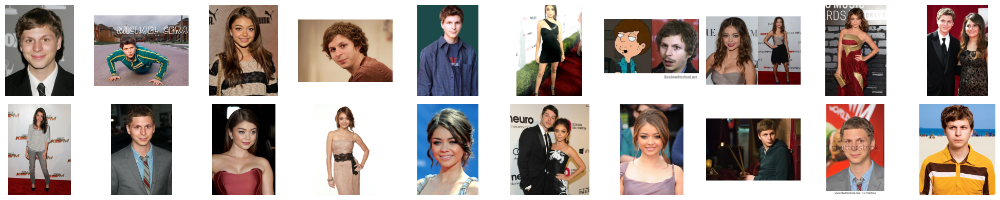

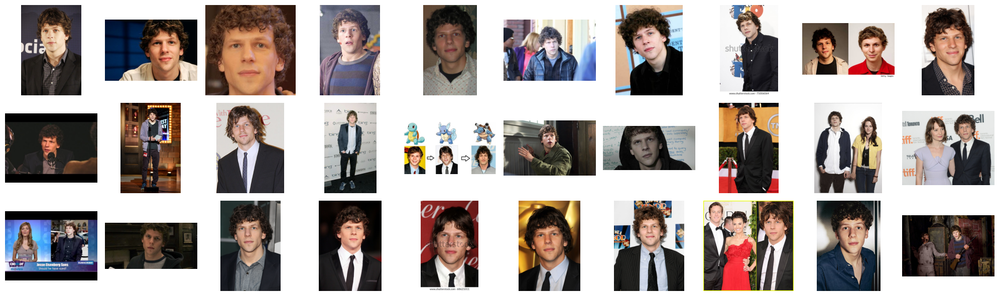

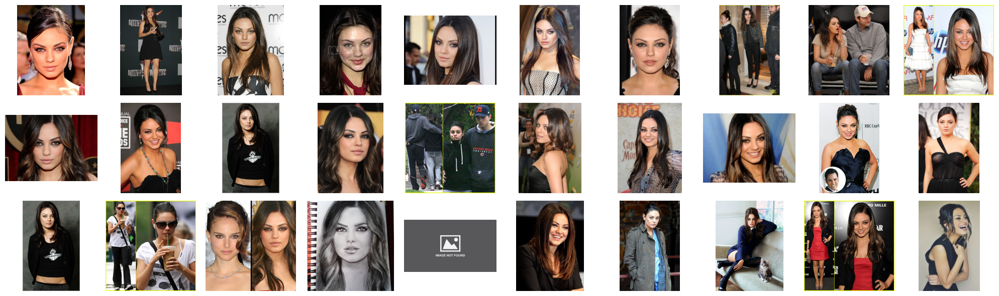

In [10]:
import matplotlib.pyplot as plt
#original training images
def display_images_by_class(images, labels, class_label, n, imgs_per_row=5):
    """Display 'n' images of a specific class from a list or array of images and their corresponding labels."""
    
    # Filter images by the specified class
    class_images = [img for img, label in zip(images, labels) if label == class_label]
    
    # Determine the number of images to display (cannot exceed the number of images in the specified class)
    n_display = min(n, len(class_images))
    
    # Calculate the number of rows needed to display 'n_display' images
    n_rows = n_display // imgs_per_row + int(n_display % imgs_per_row != 0)
    
    # Set up the figure size
    plt.figure(figsize=(imgs_per_row * 2, n_rows * 2))
    
    for i, img in enumerate(class_images[:n_display], start=1):
        plt.subplot(n_rows, imgs_per_row, i)
        plt.imshow(img)
        plt.axis('off')  # Hide the axes ticks
    
    plt.tight_layout()
    plt.show()

# Get images and their labels from the DataFrame
images = train['img']
labels = train['class'].values  # Assuming 'class' column contains the class labels

# Display the first 'n' images of a specified class
class_label = 2  
n = 30  

display_images_by_class(images,labels, 0, 20, imgs_per_row=10) 
display_images_by_class(images,labels, 1, 30, imgs_per_row=10) 
display_images_by_class(images, labels, class_label, n, imgs_per_row=10)


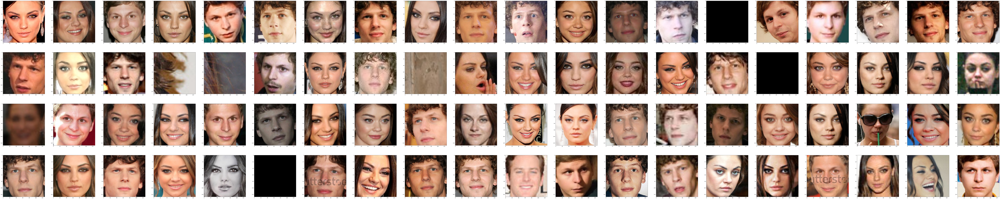

In [11]:
# Training images
plot_image_sequence(train_X, n=80, imgs_per_row=20)

Bad apples in preproccessed training set: 14,23,24,28,35,40,49,65,70

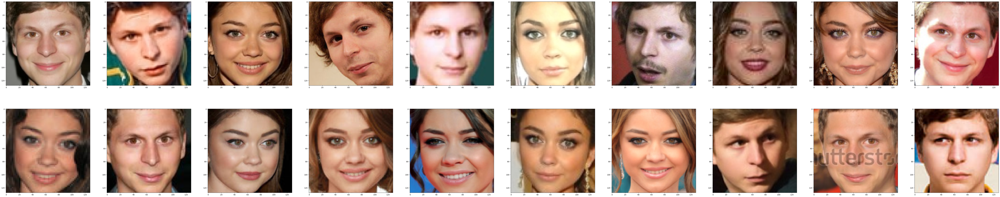

In [12]:
# plot faces of Michael and Sarah

plot_image_sequence(train_X[train_y == 0], n=20, imgs_per_row=10)

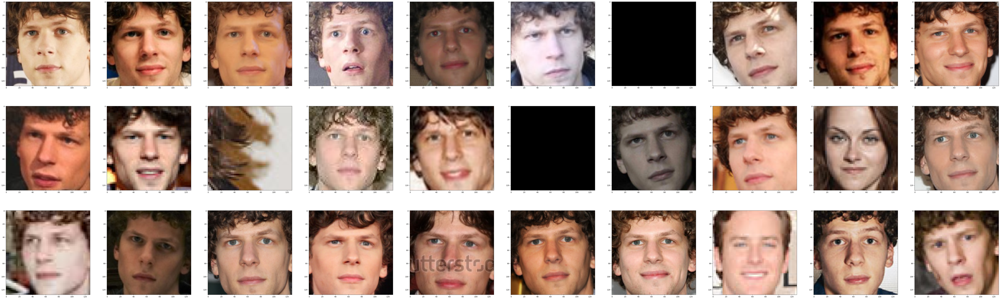

In [13]:
# plot faces of Jesse

plot_image_sequence(train_X[train_y == 1], n=30, imgs_per_row=10)

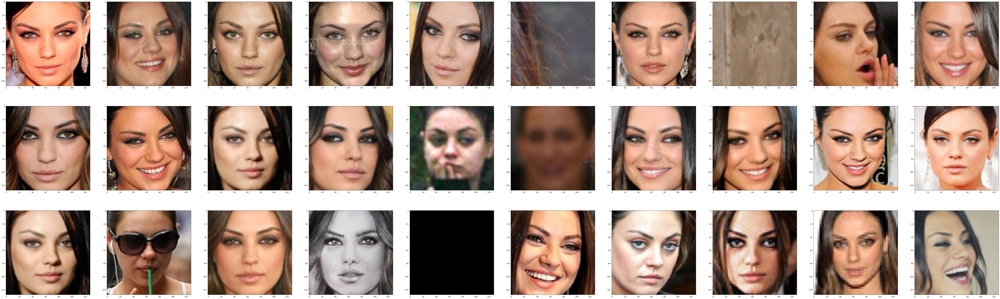

In [14]:
# plot faces of Mila

plot_image_sequence(train_X[train_y == 2], n=30, imgs_per_row=10)

## 0.4. Store Preprocessed data (optional)
<div class="alert alert-block alert-info">
<b>NOTE:</b> You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All". Feel free to use this to store intermediary results.
</div>

In [15]:
# Save preprocessed data
prep_path = '/kaggle/working/prepped_data/'
if not os.path.exists(prep_path):
    os.mkdir(prep_path)
    
np.save(os.path.join(prep_path, 'train_X.npy'), train_X)
np.save(os.path.join(prep_path, 'train_y.npy'), train_y)
np.save(os.path.join(prep_path, 'test_X.npy'), test_X)
# Load preprocessed data
prep_path = '/kaggle/working/prepped_data/'
if not os.path.exists(prep_path):
    os.mkdir(prep_path)
train_X = np.load(os.path.join(prep_path, 'train_X.npy'))
train_y = np.load(os.path.join(prep_path, 'train_y.npy'))
test_X = np.load(os.path.join(prep_path, 'test_X.npy'))

Now we are ready to rock!

# 1. Feature Representations
## 1.0. Example: Identify feature extractor
Our example feature extractor doesn't actually do anything... It just returns the input:
$$
\forall x : f(x) = x.
$$

It does make for a good placeholder and baseclass ;).

In [16]:
class IdentityFeatureExtractor:
    """A simple function that returns the input"""
    
    def transform(self, X):
        return X
    
    def __call__(self, X):
        return self.transform(X)

## 1.1. Baseline 1: HOG feature extractor/Scale Invariant Feature Transform

In [17]:
test_data = train_X[0]

if test_data.dtype != 'uint8':
    test_data = cv2.convertScaleAbs(test_data)
test_gray = cv2.cvtColor(test_data,cv2.COLOR_BGR2GRAY)


We've chosen to implement the HOGFeature extractor as it seemed the most obvious and straight forward implementation. HOG is a feature descriptor used for object detection in computer vision and image processing. It works by calculating the distribution of gradient orientations in localized portions of an image, which helps capture the shape and appearance of objects (see plots of single examples below).

### Determining influence of (hyper)parameters:

winSize: Defines the detection window size or so called region of interest. blockSize: Specifies the size of gradient computation blocks. blockStride: Determines the step size between blocks. cellSize: Defines the size of cells within each block. nbins: Specifies the number of bins in the gradient histogram.

More in depth explanation in: https://learnopencv.com/histogram-of-oriented-gradients/

In [18]:
import cv2
import matplotlib.pyplot as plt

class HOGFeatureExtractor:
    
    #check values of hyperparameters!!!
    
    #normalization for lighting effects by choosing bigger blocksize. see https://learnopencv.com/histogram-of-oriented-gradients/
    def __init__(self, winSize=(128,128),blockSize=(16,16), blockStride = (8,8), cellSize=(8,8), nbins=9):
        self.winSize = winSize
        self.blockSize = blockSize
        self.blockStride = blockStride
        self.cellSize = cellSize
        self.nbins = nbins
        
        # Create a HOG Descriptor object
        self.hog = cv2.HOGDescriptor(winSize, blockSize, blockStride, cellSize, nbins)

    def compute_single_hog_feature(self, image): 
        # Ensure the image has the correct depth
        if image.ndim>2:
            if image.dtype != np.uint8:
                image = image.astype(np.uint8)

            image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        hog_features = self.hog.compute(image)
        #hog_features = hog_features.astype(np.float32)
        return hog_features
    
    
    def compute_hog_features(self, images):
        """Compute HOG features for a list of images."""
        hog_features_list = []

        for image in images:
            # Convert the image to grayscale if it's in color
            if image.ndim > 2:
                # Ensure the image has the correct depth
                if image.dtype != np.uint8:
                    image = image.astype(np.uint8)
                image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

            # Compute HOG features for the grayscale image
            hog_features = self.hog.compute(image)
            hog_features_list.append(hog_features)

        return hog_features_list
      
    def visualize_single(self,image, hog_feature): 
        flattened_hog = hog_feature.flatten()
        # Create subplots for displaying the images
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))

        # Show the original image
        axes[0].imshow(image)
        axes[0].set_title('Original Image')
        axes[0].axis('off')

        # Visualize the HOG features
        axes[1].plot(flattened_hog)
        axes[1].set_title('Histogram of Oriented Gradients (HOG)')
        axes[1].set_xlabel('Feature Index')
        axes[1].set_ylabel('Feature Value')
        axes[1].grid(True)
        plt.show()
        
        
            
    def visualize_image_with_cell_histograms(self, image):
        """
        Visualize the original image with the histogram of each cell plotted inside the picture.
        
        Parameters:
        - image (numpy.ndarray): Original input image.
        """
        # Convert the image to grayscale if it's in color
        if image.ndim > 2:
            # Ensure the image has the correct depth
            if image.dtype != np.uint8:
                image = image.astype(np.uint8)
            image_gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

        else:
            image_gray = image
        
        # Compute HOG features for the grayscale image
        hog_features = self.compute_single_hog_feature(image)
        hog_features = hog_features.reshape(-1, self.nbins)
        
        # Calculate the number of cells in the image
        num_cells_x = image_gray.shape[1] // self.cellSize[0]
        num_cells_y = image_gray.shape[0] // self.cellSize[1]
        
        # Create subplots for displaying the images
        fig, ax = plt.subplots()
        
        # Show the original image
        ax.imshow(image, cmap='gray')
        
        # Plot the histogram of each cell
        for y in range(num_cells_y):
            for x in range(num_cells_x):
                cell_histogram = hog_features[y * num_cells_x + x]
                cell_center = ((x + 0.5) * self.cellSize[0], (y + 0.5) * self.cellSize[1])
                # Normalize the histogram for visualization
                cell_histogram_normalized = cell_histogram / np.sum(cell_histogram)
                
                # Plot the histogram as a bar histogram
                ax.bar(np.arange(self.nbins) + cell_center[0] - self.nbins / 2, 
                       cell_histogram_normalized * self.cellSize[1],  # Corrected y-coordinate
                       width=1, color='r', alpha=0.8, bottom=cell_center[1] )  # Adjusted y-coordinate
        
                
        plt.title('Original Image with Cell Histograms')
        plt.axis('off')
        plt.show()

    def visualize_image_and_hog(self, images, hog_features):
        """Visualize the original images and their HOG features side by side."""
        num_images = len(images)
        for i in range(num_images):
            # Reshape the HOG features to a 1D array
            hog_features_i = hog_features[i].flatten()

            # Create subplots for displaying the images
            fig, axes = plt.subplots(1, 2, figsize=(15, 5))

            # Show the original image
            axes[0].imshow(images[i])
            axes[0].set_title('Original Image')
            axes[0].axis('off')

            # Visualize the HOG features
            axes[1].plot(hog_features_i)
            axes[1].set_title('Histogram of Oriented Gradients (HOG)')
            axes[1].set_xlabel('Feature Index')
            axes[1].set_ylabel('Feature Value')
            axes[1].grid(True)
            
            

            plt.show()

Determining influence of hyperparameters: 


WindowSize 1 and 2:  (128, 128) (128, 128)
BlockSize 1 and 2:  (64, 64) (16, 16)
BlockStride 1 and 2:  (32, 32) (8, 8)
CellSize 1 and 2:  (32, 32) (8, 8)
(128, 128, 3)
324 8100
(128, 128, 3) (80, 128, 128, 3)


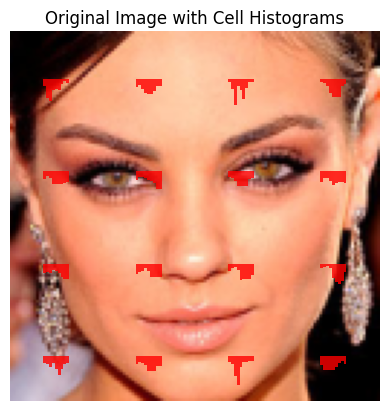

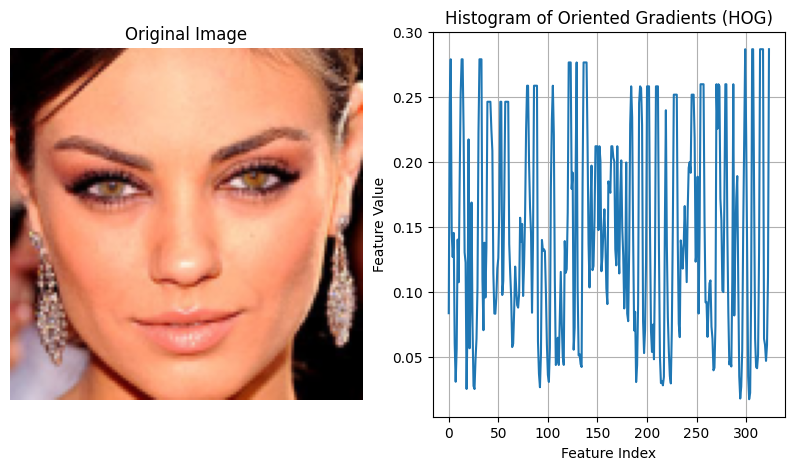

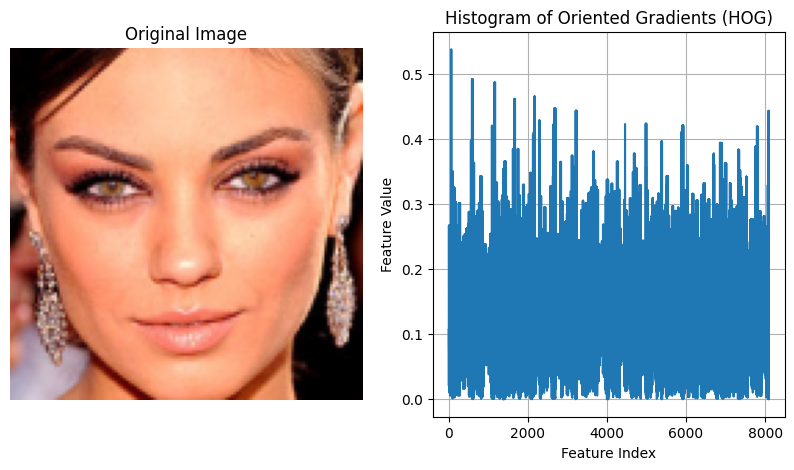

In [19]:
hog_extractor = HOGFeatureExtractor(winSize=(128,128),blockSize=(64,64), blockStride = (32,32),cellSize=(32,32))
hog_extractor2 = HOGFeatureExtractor(winSize=(128,128),nbins=9)
print("WindowSize 1 and 2: ",hog_extractor.winSize, hog_extractor2.winSize)
print("BlockSize 1 and 2: ",hog_extractor.blockSize, hog_extractor2.blockSize)
print("BlockStride 1 and 2: ",hog_extractor.blockStride, hog_extractor2.blockStride)
print("CellSize 1 and 2: ",hog_extractor.cellSize, hog_extractor2.cellSize)

print(train_X[0].shape)
hog1 = hog_extractor.compute_single_hog_feature(train_X[0])
hog2 = hog_extractor2.compute_single_hog_feature(train_X[0])

print(hog1.size, hog2.size)
print(train_X[0].shape,train_X.shape)

hog_extractor.visualize_image_with_cell_histograms(train_X[0])

hog_extractor.visualize_single(train_X[0],hog1)
hog_extractor2.visualize_single(train_X[0],hog2)


In [20]:
# Example usage
# Assuming 'train' is your DataFrame and you're using 'preprocessor' to preprocess the images
train_X, train_y = preprocessor(train), train['class'].values

#temporary fix

bad_apples = [14, 23, 24, 28, 35, 40, 49, 65, 70]
train_X = np.delete(train_X, bad_apples, axis=0)
train_y = np.delete(train_y, bad_apples, axis=0)

print(train_X.shape)
print(train_X.shape)
# Create a HOGFeatureExtractor object
hog_extractor = HOGFeatureExtractor(winSize=(128,128),blockSize=(16,16), blockStride = (8,8),cellSize=(8,8))

# Compute HOG features for the images
hog_features = hog_extractor.compute_hog_features(train_X)

# # Visualize the original images and their HOG features
#hog_extractor.visualize_image_and_hog(train_X, hog_features)

(71, 128, 128, 3)
(71, 128, 128, 3)


/tmp/ipykernel_18/4005177570.py:53: RuntimeWarning: invalid value encountered in cast
  return np.stack([self.preprocess(row) for _, row in data.iterrows()]).astype(int)


### 1.1.1. t-SNE Plots
t-SNE plots reduce the data to 2 dimensions allowing for interoperable data and visualisation of clusters 

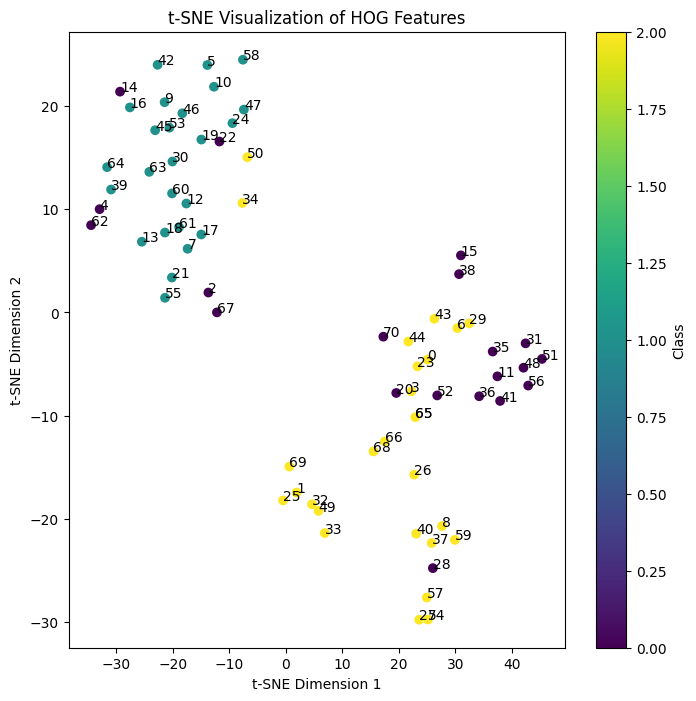

In [21]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Reshape the HOG features into a 2D array (each row represents a feature vector)
hog_features_array = np.array(hog_features).reshape(len(hog_features), -1)

# Perform t-SNE dimensionality reduction
tsne = TSNE(n_components=2, perplexity=3, learning_rate=50)
hog_features_embedded = tsne.fit_transform(hog_features_array)

# Create the scatter plot
plt.figure(figsize=(8, 8))
scatter = plt.scatter(hog_features_embedded[:, 0], hog_features_embedded[:, 1], c=train_y, cmap='viridis')
plt.title('t-SNE Visualization of HOG Features')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.colorbar(scatter, label='Class')

# Annotate each data point with its index
for i, txt in enumerate(train_X):
    if i== 65:
        plt.annotate(str(i), (hog_features_embedded[i, 0], hog_features_embedded[i, 1])) #n-th image of training (not starting with 0)
    plt.annotate(str(i), (hog_features_embedded[i, 0], hog_features_embedded[i, 1])) #n-th image of training (not starting with 0)
plt.savefig('/kaggle/working/hog_features_tsne_plot.png')
plt.show()


In [22]:
# Initialize a list to store the sizes
image_sizes = []

# Iterate over each row in the train dataframe
for index, row in train.iterrows():
    # Get the image as a numpy array from the 'img' column
    image = row['img']
    # Append the shape of the image to the list
    # The shape is a tuple in the form of (height, width, channels)
    image_sizes.append(image.shape)

from collections import Counter

# Count the occurrences of each size
size_counts = Counter(image_sizes)

# Find the most common size
most_common_size, count = size_counts.most_common(1)[0]
# Now, image_sizes contains the dimensions of all images in the training set
print(f"The most common size is: {most_common_size} (found in {count} images)")

The most common size is: (300, 300, 3) (found in 6 images)


### 1.1.2. Discussion
The plot shows satisfactory result but not outstanding. The Jesse class exhibits strong discriminative characteristics and robust clustering. However, the HOG features of the look-a-likes reduced to 2 dimensional space does have some overlap or missclassification with the Mila class. This suggests that while the t-SNE visualization captures distinguishing features well, but there may be nuanced similarities between different classes that require further improvements.

Before computing the features, the images are subjected to the a tuned version of the HAARPreprocessor class which detects and extracts the faces of the training and test images. Image resizing is also done to ensure all images have consistent dimensions. Color space conversion to grayscale was also executed for simpler feature extraction.

Parameters and their influence: 
n_components: Reduced dimensionality to 2 for 2D visualization. 
perplexity: This balances the local and global aspects of the data. 
Lower perplexity values (like we've opter for here) lead to more focus on local structure, while higher values capture more global structure. Lower values can be useful for visualizing clusters of data points that are close to each other in the high-dimensional space.
learning_rate: The learning rate parameter controls the step size at each iteration of the optimization process. Higher learning rates can result in faster convergence but may risk overshooting the optimal solution

## 1.2. Baseline 2: PCA feature extractor
PCA is a technique that reduces the dimensionality of data, in this case images, while maintaining the most important features.  

In our PCA feature extractor, the images go through many processing steps.
1. Images are first converted to greyscale. This mean they have only one channel, making the flattening process slightly easier.
2. Images are then flattened into a 2D matrix. In our case, each row of the matrix represents one image and each column represents a certain pixel. For example, column 1 represents pixel (0,0) from each of the images, column 2 represents pixel (0,1) and so on. Now we have a dataset (single matrix) of all the images that we can perform PCA on.
3. Images are then centered using mean subtraction, a process which involves calculating the mean of each pixel (column) and subtracting the resulting vector from each image (row). This results in a new dataset of centered images, where each pixel value has been shifted so that the mean value of that pixel across all images becomes zero. 
4. The dataset of centered images is then normalised. By dividing each feature (column) by its standard deviation we ensure that all the features, i.e pixel intensity values, have a similar scale, preventing pixels with larger intensity ranges from dominating the variance calculation. In the ccontext of facial recognition, this ensures that variations in overall brightness or contrast across images do not influence the principal components disproportionately. This is crucial as our goal is to capture the intrinsic features of faces regardless of variations in lighting conditions or exposure settings.
5. The covariance matrix is of the centered and normalised dataset is found. We then perform eigenvalue decomposition. This is a process in which the eigenvectors and eigenvalues of the covariance matrix are computed. The principal componenets (eigenvectors) denote the directions of maximum variance between the pixel values. The corresponding eigenvalues denote the amount of variance each of the principal components captures. These principal componenets are essentially the "features" of the data, each representing a unique pattern of variation across the images. It is with these "features" that we distinguish between faces in the classification stage later on. As we have 71 images in our training set (not 80 as bad apples have been removed) we get 71 principal components (eigenvectors). We choose a certain, optimal number of these principal components to use later during classification. 

We chose to use eigenvalue decomposition over single-value decomposition for our feature extraction as we had a more intuitive understanding of how the eigenvectors and corresponding eigenvalues described variations in the data-set when compared to SVD.  
However upon further research we have concluded that SVD would have made a better choice for extracting eigenfaces due to numerical stability and robustness especially when dealing with real-world datasets that may exhibit noise, irregularities, or non-ideal properties such as ours.

In [23]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np


class PCAFeatureExtractor(IdentityFeatureExtractor):
    
    def __init__(self, n_components):
        self.n_components = n_components

    def convert_to_gray(images):
        gray_images = []
        for img in images:
            img = img.astype(np.uint8)
            gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
            gray_images.append(gray)
        return gray_images
    
    def flatten_images(images, resize_target):
        gray_images = PCAFeatureExtractor.convert_to_gray(images)
        
        # Create a 2d Array to store the flattened images, array size = num images x (image height x width)
        # resize the images down to reduce computation time for testing
        num_images = len(gray_images)
        flattened_images = np.zeros(( num_images, resize_target * resize_target))
        
        # Flatten each image and add it to the matrix of flattened images
        for i, img in enumerate(gray_images):
            resized_img = cv.resize(img, (resize_target,resize_target), interpolation=cv2.INTER_AREA)
            flattened_img = resized_img.flatten()
            flattened_images[i, :] = flattened_img
            
        # Flattened_images is now a 2D matrix, each row represents an image, each coloum represents a different pixel 
        # from each of the images. i.e. column vector 1 will be the (0,0) pixel from each image, and so on...
        return flattened_images
    
    # Returns a vector of the mean of each feature (column) and the centered matrix 
    def center_images(flattened_images):
        mean_image = np.mean(flattened_images, axis=0)
        centered_images = flattened_images - mean_image
        return mean_image, centered_images

    # Normalises the images so that each has a standard deviation of one
    def normalise_images(mean_image, centered_images):
        stdv = np.std(centered_images, axis=0)
        normalised_images = (centered_images)/stdv
        return normalised_images
        
    # Processes images and computes eigenvectors and eigenvalues from the covariance matrix of the processed images  
    def eigenvalue_decomposition(images, resize_target):
        #compute transpose of centered, normalised images
        images_transposed = images.T
        #compute covariance matrix
        covariance_matrix = np.cov(images_transposed)
        #extract eigenvalues
        eigenvalues, eigenvectors = np.linalg.eig(covariance_matrix)
        
        return eigenvalues, eigenvectors, 

### 1.2.1. Eigenface Plots
Here we call our PCA feature extractor and extract the eigenvectors and values from our data see.  
Note that this computation can have significant wait times so we resized the images down from 128 x 128 to 64 x 64. 

In [24]:
resize_target = 64# target height and width of images
images = np.copy(train_X) #insert image set to be extracted here 

#process image set: flatten, centre and normalise
flattened_images = PCAFeatureExtractor.flatten_images(images, resize_target)
mean_image, centered_images = PCAFeatureExtractor.center_images(flattened_images)
normalised_images = PCAFeatureExtractor.normalise_images(mean_image, centered_images)
#extract eigen vectors and eigen values
eigenvalues, eigenvectors = PCAFeatureExtractor.eigenvalue_decomposition(normalised_images,resize_target)

Here we calculate the number of non zero eigen values and get a value of 70, one less than the maximum 71 non-zero eigen vectors that could have been extracted from the 71 images in training set (after the removal of bad apples).   

In [25]:
count = 0
for e in np.round(np.real(eigenvalues),8):
    if  e != 0:
        count +=1
print(f"The number of non-zero Eigen Values is {count} ")

The number of non-zero Eigen Values is 70 


The code below sorts the eigenfaces in descending order of eigenvalues, creating a list with the most signiicant principle components first.   
The ten most significant eigenfaces are then processed for display and plotted.

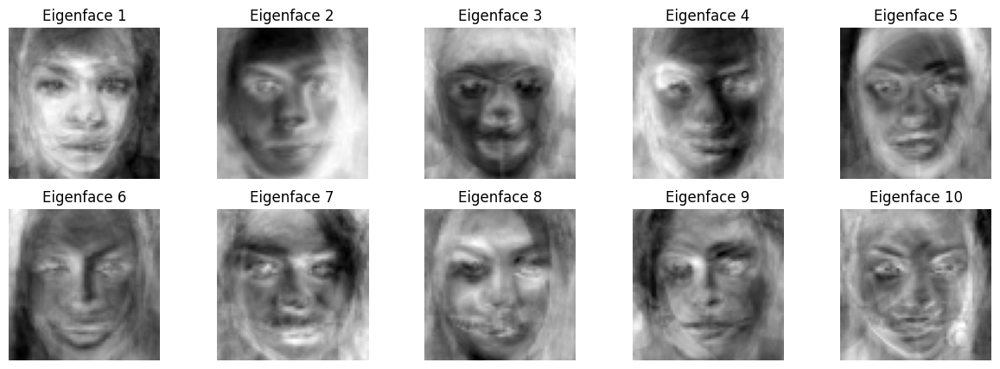

In [26]:

# Sort the eigen vectors in descending order of eigenvalues,i.e most significant principle components first
def sort_eigenvectors(eigenvalues, eigenvectors):
    sorted_indices = np.argsort(eigenvalues)[::-1]
    sorted_eigenvalues = eigenvalues[sorted_indices]
    sorted_eigenvectors = eigenvectors[:, sorted_indices]
    return sorted_eigenvectors

#process 1D eigen_vectors to be displayed as images in greyscale
def process_eigen_images(img):
    #remove complex nums and reshape to 2D matrix
    img = np.real(img.reshape(resize_target,resize_target)) 
    # scale and offset the matrix to fall in 0-255 range for greyscale showing
    min_v = np.min(img)
    max_v = np.max(img)
    scale = 255 / (max_v - min_v)
    img = (img - min_v) * scale
    
    img = img.astype(np.uint8)
    return img

eigenfaces = sort_eigenvectors(eigenvalues, eigenvectors)
plt.figure(figsize=(15, 5))
# Plot the top ten most significant eigfaces
for i in range(0,10):
    eigenface = process_eigen_images(eigenfaces[:,i]) #process eigenface for display
    
    plt.subplot(2, 5, i + 1)  
    plt.imshow(eigenface, cmap='gray')
    plt.title(f"Eigenface {i + 1}")
    plt.axis('off')

The cell below reconstructs an image with the facespace extracted from training data using progressively more eigenfaces.

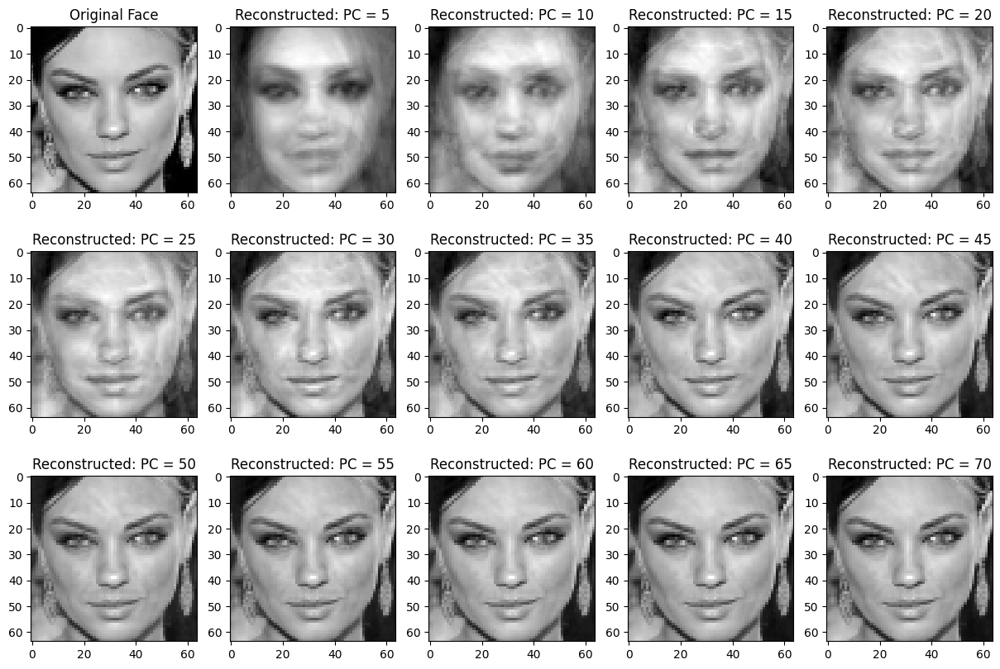

In [27]:
# Project the face to be reconstructed onto the facespace/featurepace, i.e subspace spanned by the eigenfaces
def project_face(face, mean_image, eigenvectors):
    centered_face =  face - mean_image #.reshape(64,64)
    coefficients = np.dot(centered_face, eigenvectors)
    return coefficients

# Reconstruct the face using the coefficients calculated during projection and the eigenfaces
def reconstruct_face(coefficients, mean_image, eigenvectors):
    reconstructed_face = mean_image + np.dot(coefficients, eigenvectors.T)
    return reconstructed_face

#image to be reconstructed
reconstruction_image = train_X[0]
flattened_image = PCAFeatureExtractor.flatten_images([reconstruction_image], resize_target)
#process the original image to greyscale. resize to resize target and plot 
display_original_face = cv2.resize(cv2.cvtColor(cv2.convertScaleAbs(reconstruction_image), cv2.COLOR_BGR2GRAY),(resize_target,resize_target))
plt.figure(figsize=(15, 10))
plt.subplot(3, 5, 1)
plt.imshow(display_original_face, cmap='gray')
plt.title('Original Face')

# plot reconstructions of the original face as a linar combination of eigenfaces
# increase the number of eigenfaces used by 5 with each reconstruction
for i in range(1,15):
    # select number of principle components(eigenfaces) to be used in reconstruction
    num_components = i*5  
    selected_eigenfaces = eigenfaces[:, :num_components] 
    # Calculate coefficeints for linear combination and reconstruct image
    coefficients = project_face(flattened_image, mean_image, selected_eigenfaces)
    reconstructed_face = reconstruct_face(coefficients, mean_image, selected_eigenfaces)
    #process reconstructed image for display and plot
    reconstructed_face =  process_eigen_images(reconstructed_face)
    plt.subplot(3, 5, i+1)
    plt.imshow(reconstructed_face,cmap='gray')
    plt.title(f'Reconstructed: PC = {num_components}')

Here the average loss between the reconstructed and original images is calculated, using mean squared error, for all eigenvectors whose correspoding eigenvalue is non-zero.
As can be seen from the graph, even using the entire facespace, there is still some loss however the reconstruction plots above shows that this loss is not significant visually.
Combining the results from the loss graph below and observation of the reconstructed images 55 was chosen as a value for p, i.e the number of principle components required to effectively capture the variability of the data.
With 55 principle components there is a large reduction in the dimensionality of theg feature space and there is relatively low loss in the reconstruction, just some small variations in the image texture and lighting that are made more noticable due to our low pixel resolution.


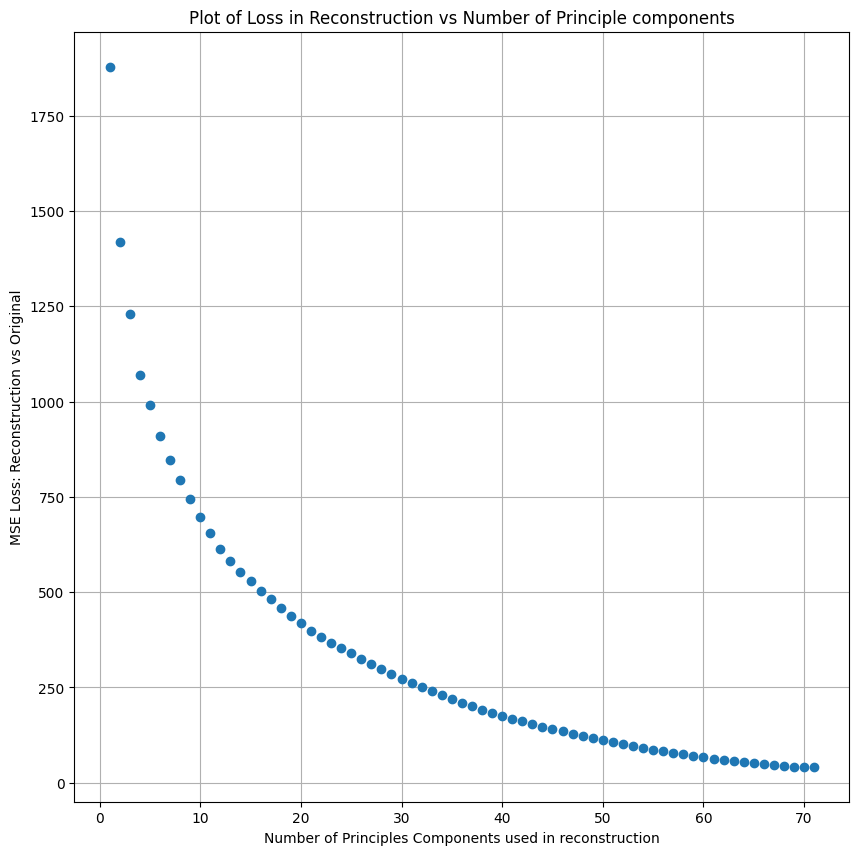

In [28]:
#resize all faces to resize target and convert to gray
def resize_images(images, resize_target):
    resized_images = []
    for img in images:
        img = cv2.cvtColor(cv2.convertScaleAbs(img), cv2.COLOR_BGR2GRAY)
        img = cv2.resize(img,resize_target)
        resized_images.append(img)
    return resized_images
    
#calculate MSE loss between two images
def image_MSE(image1, image2):
    mse_value = np.mean((image1 - image2) ** 2)
    return mse_value

images_copy = np.copy(train_X)
resized_images = resize_images(images_copy, (resize_target,resize_target))

#71 non eigenvectors with non zero eigen values
PC_nums = np.arange(1, 72)
#array to store average loss of all images per number of principle components home 
MSE_per_PC = []
#For increasing number of principle compoinents used, reconstruct every face in the training set and calculate the average loss
for PC_num in PC_nums:
    MSE_value = 0
    for face_num in range(0,71):
        #Calculate coefficeints for linear combination and reconstruct image
        selected_eigenfaces = eigenfaces[:, :PC_num] 
        coefficients = project_face(flattened_images[face_num], mean_image, selected_eigenfaces)
        reconstructed_face = reconstruct_face(coefficients, mean_image, selected_eigenfaces)
        #calculate loss and add to total of all images
        MSE_value = MSE_value + image_MSE(resized_images[face_num], reconstructed_face.reshape(resize_target,resize_target))   
    #get average off loss for current number of PCs and append to array
    MSE_per_PC.append(round(np.real(MSE_value/71),2))

#plot avg loss vs number of PCs used in reconstruction
plt.figure(figsize=(10, 10))
plt.ylabel('MSE Loss: Reconstruction vs Original')
plt.xlabel('Number of Principles Components used in reconstruction')
plt.title('Plot of Loss in Reconstruction vs Number of Principle components')
plt.grid(True)
plt.plot(PC_nums, MSE_per_PC, 'o')

           
# Set printing options to limit the display to 10 elements
np.set_printoptions(threshold=10)

### 1.2.2. Feature Space Plots


Here the training set faces are plotted against the two most significant principle components.  

Images of Jesse Eisenberg are distributed in the upper half of the plot, favouring the left side, while images of Mila tend to be oppositiely distributed in the bottom half of the plot, favouring the right side. Among these two classes the visulation shows some definitive discriminative properties however with the images of the two look alikes the discriminativeness of the visualisation is greatly diminished. The center of the plot contains an indiscernable mixture of all faces classes, while images of Sarah hyland are distributed acorss the same area as Mil and images of Michale Cera appear in the regions of both Mila and Jesse.

The visualisation seems to also have moderate robustness properties. Images of the same face with different poses, facial expressions and lighting still seem to cluster together showing a invariance to noise in input.

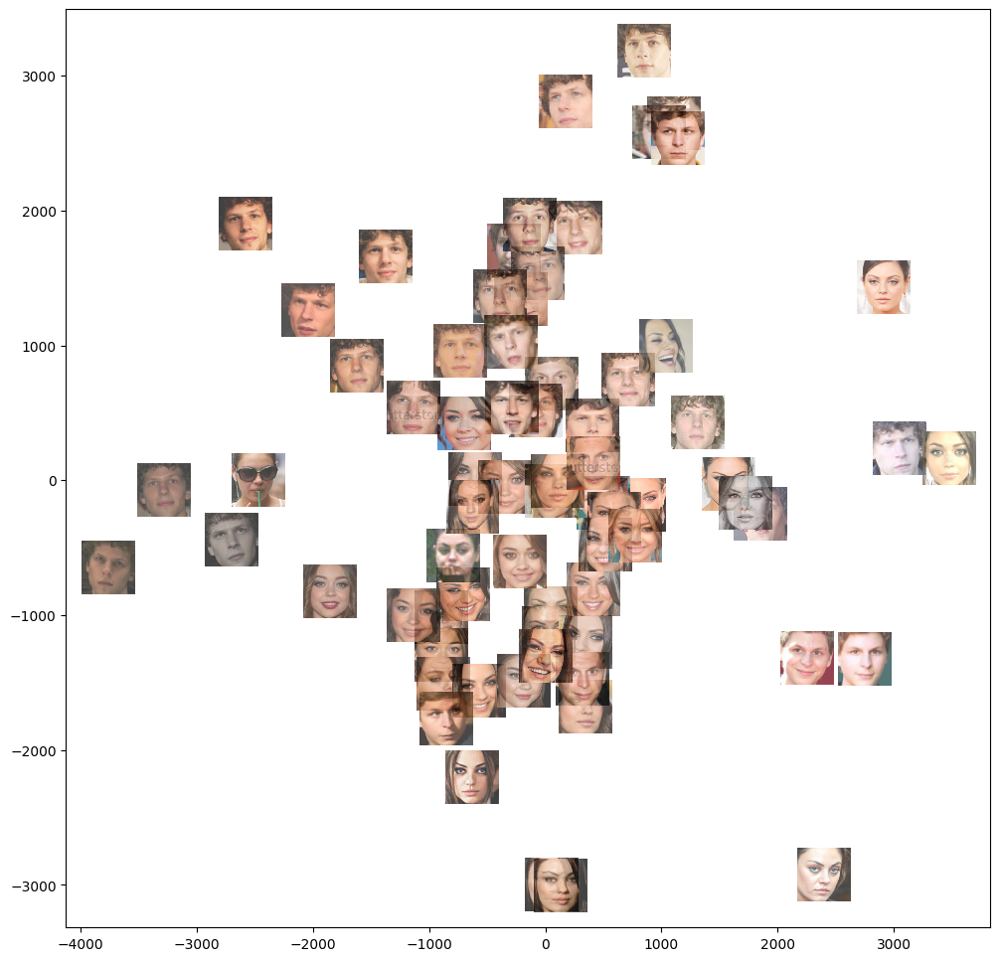

In [29]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox #libraries for plotting images

#processes the image to annotate a point on the scatter plot, alpha is opacity level, zoom is image size
def getImage(i, zoom=0.3):
    return OffsetImage(train_X[i], zoom=zoom,alpha=0.75)

# Project images onto the space defined by the first two principal components, calculating points for scatter plot
projected_points = np.real(np.dot(centered_images, eigenvectors[:, :2]))
 
# create scatter plot
fig, ax = plt.subplots(figsize=(12, 12))
ax.scatter(projected_points[:, 0], projected_points[:, 1] ,alpha=0.1) 

# annotate points on scatter plot with corresponding face images
for i, (x, y) in enumerate(projected_points):
    ab = AnnotationBbox(getImage(i), (x,y), frameon=False)
    ax.add_artist(ab)

### 1.2.3. Discussion

Our approach successfully demonstrates the application of PCA for feature extraction and provides visual insights into the learned feature space, however there are areas for improvement, primarily our choice of EVD over SVD. This decision most likely reduced the quality of our feature extractiion, decreasing it's resistance to noise and outliers (such as images in our training set where a face wasn't correctly captured) and increasing it's computational complexity.

Despite this mistake, we succeeded in preprocessing our training data to make it suitable for PCA feature extraction, choosing to centre (apply mean subtraction) to our flattened images to capture variations relative to the mean instead of absolutely and to normalise our data to avoid features with a greater magnitude of scale, dominating the feature extraction.

The result of this feature extraction was a featurespace that could successfully reconstruct images with a reduced dimensionality of p= 55. these 55 extracted principle components did cause some small disturbances in intensity and texture when used to reconstruct images however to the visual observer this image loss is neglible.

When the training set was visualised on a projection to the first two principle components of the feature space we saw the flawed but still considerable descriminative and robustness properties of our extraction, showing obvious clustering of our two primary classes, Mila and Jesse, albeit with a large degree scattering of look alikes throughout both their clusters, with the descriminative properties being particularly weak among images of Mila and Sarah.

# 2. Evaluation Metrics

## 2.1 Precision, Recall and Accuracy (given)

Accuracy is a good evaluation metric for overall performance as it is simply the proportion of correctly classified cases. It is the evaluation metric used in competition so the main one we will focus on when improving the pipeline.

Precision is a good evluation metric for facial recognition as it discourages false positives. Take, for instance, the scenario of using face detection as an alternative to a password on smartphone. It would be more important to prevent unauthorised access (a false positive) rather than occasionally having the authorised person retry in the case of not being correctly recognised (a false negative).

Recall may also be a useful metric for facial recognition as it incentivises correctly identifying all true positives. Take, for instance, a surveillance scenario when attempting to identify suspects in a criminal case. Missing a known suspect due to low recall (a false negative) is heavily disincentivised in this scenario. A high recall score would be more important than a high precision score in this scenario.

Precision and recall will also give insight into where our pipeline looses its accuracy when testing. For example, we found that in lots of cases our classifiers had a high recall for Jesse and Mila (class 1 and 2) but a low recall for neither (class 0). This means that our classifier was correctly identifying almost all of the Jesses and Milas but was also predicting many of the class 0 images were also Jesse and Mila. This information was gained from the precision and recall metrics and accuracy alone would not have given us this insight. 

This info guided our pipeline refinements in trying to classify less class 0s as class 1/2s. A concrete example of this being our first ensamble pipeline, that used both the HOG and PCA classifiers. This pipeline would use both classifiers, take the results from both and make a final prediction. The final prediction would only be class 1/2 (Jesse or Mila) if *both* classifiers had classed them as class 1/2. This meant that if either of the classifier classed an image as class 0 (neither) it would be given more credence. This gave higher recall for class 0 and improved overall accuracy by 6/7%.

In [30]:
from sklearn.metrics import precision_score, recall_score, accuracy_score, confusion_matrix, classification_report

class EvaluationMetric:
    """Class for evaluation metrics. Each function gives evaluation using a different metric."""
    
    def accuracy(label, predicted_label):
        accuracy = accuracy_score(label, predicted_label)
        print("Accuracy: ", round(accuracy, 3), "\n")
        
    def precision(label, predicted_label):
        precision_per_class = precision_score(label, predicted_label, average=None)

        print("Precision for each class:")
        for cls, precision in enumerate(precision_per_class):
            print("Class {}: {:.3f}".format(cls, precision))

        # Calculate macro-average and weighted-average precision 
        macro_precision = precision_score(label, predicted_label, average='macro')
        weighted_precision = precision_score(label, predicted_label, average='weighted')
        print("Macro-average Precision:", round(macro_precision, 3))
        print("Weighted-average Precision:", round(weighted_precision, 3), "\n")
            
    def recall(label, predicted_label):
        recall_per_class = recall_score(label, predicted_label, average=None)

        print("Recall for each class:")
        for cls, recall in enumerate(recall_per_class):
            print("Class {}: {:.3f}".format(cls, recall))

        # Calculate macro-average and weighted-average recall
        macro_recall = recall_score(label, predicted_label, average='macro')
        weighted_recall = recall_score(label, predicted_label, average='weighted')
        print("Macro-average Recall:", round(macro_recall, 3))
        print("Weighted-average Recall:", round(weighted_recall, 3), "\n")

# 3. Classifiers
## 3.0. Example: The *'not so smart'* classifier
 *Removed as not used*

## 3.1. Baseline 1: HOG Classifier
This classifier uses the HOG feature extractor developed in section 1 to extract features from the training data and an SVM classifier to learn patterns / relationships in the HOG feature representations of this data, enabling the prediction of labels on the test data based on the learned patterns.

In [31]:
from sklearn.ensemble import RandomForestClassifier
from  sklearn import svm

class HOGClassificationModel:
    """Classifier based on HOG features."""
    
    def __init__(self):
        self.model = svm.SVC(kernel='linear', degree = 2, C=0.001, gamma=0.0001) 
        #RandomForestClassifier(random_state=random_seed)  # The underlying Random Forest model
    
    """Select the model, easier parameter testing"""
    def set_model(self, model):
        #for faster parameter testing 
        self.model = model
        
    def fit(self, X, y):
        """Fit the model using the training data."""
        # Instantiate the HOG feature extractor
        hog_extractor = HOGFeatureExtractor()
        
        # Compute HOG features for the training data
        hog_features = hog_extractor.compute_hog_features(X)
        
        # Fit the Random Forest model using the HOG features
        self.model.fit(hog_features, y)
        
    def predict(self, X):
        """Predict labels for the input data."""
        # Compute HOG features for the input data
        hog_extractor = HOGFeatureExtractor()
        hog_features = hog_extractor.compute_hog_features(X)
        
        # Predict labels using the SVM model
        return self.model.predict(hog_features)


## 3.2. PCA Classifier
This classifier uses the PCA feature extractor developed in section 1 to extract principal components (eigenvectors) from the training data and an SVM classifier to learn patterns / relationships in these principal components, enabling the prediction of labels on the test data based on the learned patterns.

In [32]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn import svm
import matplotlib.pyplot as plt

class PCAClassificationModel:
    """Classifier based on PCA features."""
    
    def __init__(self):
        #best accuracy so far
        self.model = svm.SVC(kernel='linear', degree = 2, C=0.01, gamma=0.0001)
        #RandomForestClassifier(random_state=random_seed)  
        self.mean_image = None
        self.eigenvectors = None
        self.target_size = 64
        self.std_dev = None
        
    """Select the model, easier parameter testing"""
    def set_model(self, model):
        self.model = model
            
    def fit(self, X, y, selected_eigenvectors):
        """Fit the model using the training data."""
        flattened_images = PCAFeatureExtractor.flatten_images(X, self.target_size)
        self.mean_image, centered_images = PCAFeatureExtractor.center_images(flattened_images)
        self.std_dev = np.std(centered_images, axis=0)  # Save the standard deviation
        normalised_images = centered_images / self.std_dev  # Use the saved std_dev for normalization
        
        "commented out for testing purposes, using eigenvectors and values previouisly calculated"
        #eigenvalues, eigenvectors = PCAFeatureExtractor.eigenvalue_decomposition(normalised_images, self.target_size)
        self.eigenvectors = sort_eigenvectors(eigenvalues, eigenvectors)
                    
        # Compute features for the training data
        training_projection = np.dot(normalised_images, self.eigenvectors[:, selected_eigenvectors])
        training_projection_real = np.real(training_projection)

        # Fit the Random Forest model using the features
        self.model.fit(training_projection_real, y)
        
    def predict(self, X , selected_eigenvectors):
        """Predict labels for the input data."""
        flattened_input = PCAFeatureExtractor.flatten_images(X, self.target_size)
        centered_input = flattened_input - self.mean_image
        
        # Normalize the centered input data using the saved std_dev
        normalised_input = centered_input / self.std_dev  
        
        
        """picking the specific eiugenvectors to use now"""
      
        projected_input = np.dot(normalised_input, self.eigenvectors[:,selected_eigenvectors])
        projected_input_real = np.real(projected_input)
        
        # Predict labels using the Random Forest model
        return self.model.predict(projected_input_real)

# 4. Experiments
<div class="alert alert-block alert-info"> <b>NOTE:</b> Do <i>NOT</i> use this section to keep track of every little change you make in your code! Instead, highlight the most important findings and the major (best) pipelines that you've discovered.  
</div>
<br>


## 4.0. Labels for test data
These 370 test set images were labelled so that we could run the code locally and get a gauge for how good our accuracy, precision and recall were. They were not used to train the classifier in any way, simply give us an indication of which changes were improving the overall model. During the testing phase the code would take 10-15 minutes to run and submitting each time a test was needed would be very time consuming as the entire notebook must run. We believed it easier to test on a small subset of the test set by simply running the one cell containing the test. In hindsight, it would have been more methodically correct to portion a small section of the training data and use this as the test set as in a real-life scenario we would not have access to the test set.

In [33]:
# Correct labels for 370 training examples
correct_labels = np.array([1,0,0,0,1,1,1,0,1,0,
                           2,1,2,0,0,0,1,0,0,1, 
                           2,2,2,1,0,1,0,0,0,2,
                           2,1,0,0,0,0,1,0,0,1, 
                           0,1,1,1,0,1,1,0,0,0,
                           1,0,0,0,2,0,2,0,0,1, 
                           2,0,0,2,0,0,0,0,1,0,
                           0,0,0,0,0,0,0,2,1,0,
                           0,0,2,0,0,2,0,0,2,2,
                           0,0,0,0,2,0,0,0,1,2,
                           0,0,0,0,1,0,0,0,0,0,
                           1,0,2,2,0,0,0,0,0,2,
                           0,0,0,2,2,0,0,2,0,2,
                           0,2,0,0,0,0,0,0,0,0,
                           0,1,0,0,0,2,0,0,1,0,
                           0,0,2,0,2,0,0,0,0,0,
                           1,0,2,2,1,0,1,2,1,0,
                           0,0,2,1,0,0,2,2,0,0,
                           0,0,2,0,0,0,2,0,0,2,
                           0,0,0,0,0,1,0,2,0,0,
                           0,1,0,0,1,0,0,2,0,1,
                           0,0,0,0,1,0,0,1,1,2,
                           0,0,0,0,2,0,0,0,2,2,
                           1,0,0,0,0,0,2,2,2,0,
                           0,0,1,0,0,0,2,0,2,0,
                           0,0,0,0,0,0,0,1,0,1,
                           0,0,0,2,0,0,0,0,2,0,
                           1,0,0,0,0,0,0,0,2,0,
                           2,1,0,2,1,1,0,0,2,0,
                           1,2,0,0,0,0,0,0,0,1,
                           0,0,2,1,2,1,0,0,0,0,
                           0,0,0,2,0,2,0,1,2,1,
                           2,2,0,0,0,0,0,1,0,1,
                           1,2,0,0,0,2,0,1,0,0,
                           0,0,0,2,0,2,0,0,0,2,
                           1,0,0,0,1,1,0,1,0,1,
                           2,0,0,1,1,1,0,1,1,1,])


## 4.1. HOG Classifier Pipeline
Uses only the multilabel HOG classifier to train and predict 

In [34]:
classifier = HOGClassificationModel()
classifier.set_model(svm.SVC(kernel='sigmoid', degree = 2, C=100, gamma=0.01))

#best parameters:{'C': 100, 'degree': 2, 'gamma': 0.01, 'kernel': 'sigmoid'}
# train the model on the features
classifier.fit(train_X, train_y)

# model/final pipeline
model = lambda X: classifier.predict(X)

In [35]:
# evaluate performance of the model on the training set 
train_y_star = model(train_X)

print("Training", "\n")
EvaluationMetric.accuracy(train_y, train_y_star)
EvaluationMetric.precision(train_y, train_y_star)
EvaluationMetric.recall(train_y, train_y_star)

# predict the labels for the test set 
test_y_star = model(test_X)
prediction_labels = np.array(test_y_star[0:370])

print("Test set", "\n")
EvaluationMetric.accuracy(correct_labels, prediction_labels)
EvaluationMetric.precision(correct_labels, prediction_labels)
EvaluationMetric.recall(correct_labels, prediction_labels)



Training 

Accuracy:  1.0 

Precision for each class:
Class 0: 1.000
Class 1: 1.000
Class 2: 1.000
Macro-average Precision: 1.0
Weighted-average Precision: 1.0 

Recall for each class:
Class 0: 1.000
Class 1: 1.000
Class 2: 1.000
Macro-average Recall: 1.0
Weighted-average Recall: 1.0 

Test set 

Accuracy:  0.754 

Precision for each class:
Class 0: 0.968
Class 1: 0.648
Class 2: 0.559
Macro-average Precision: 0.725
Weighted-average Precision: 0.832 

Recall for each class:
Class 0: 0.639
Class 1: 1.000
Class 2: 0.899
Macro-average Recall: 0.846
Weighted-average Recall: 0.754 



## 4.2. PCA Classifier Pipeline 


In [36]:
pca_classifier = PCAClassificationModel()
pca_classifier.set_model(svm.SVC(kernel='linear', degree = 2, C=0.01, gamma=0.0001))

#Corresponding params: {'C': 0.01, 'degree': 2, 'gamma': 0.0001, 'kernel': 'linear'}

selected_eigenvectors = np.arange(22)
# train the model on the features
pca_classifier.fit(train_X, train_y,  selected_eigenvectors)

# model/final pipeline
model = lambda X: pca_classifier.predict(X, selected_eigenvectors)

In [37]:
# evaluate performance of the model on the training set 
train_y_star = model(train_X)

print("Training", "\n")
EvaluationMetric.accuracy(train_y, train_y_star)
EvaluationMetric.precision(train_y, train_y_star)
EvaluationMetric.recall(train_y, train_y_star)

# predict the labels for the test set 
test_y_star = model(test_X)
prediction_labels = np.array(test_y_star[0:370])



print("Test set", "\n")
EvaluationMetric.accuracy(correct_labels, prediction_labels)
EvaluationMetric.precision(correct_labels, prediction_labels)
EvaluationMetric.recall(correct_labels, prediction_labels)

Training 

Accuracy:  1.0 

Precision for each class:
Class 0: 1.000
Class 1: 1.000
Class 2: 1.000
Macro-average Precision: 1.0
Weighted-average Precision: 1.0 

Recall for each class:
Class 0: 1.000
Class 1: 1.000
Class 2: 1.000
Macro-average Recall: 1.0
Weighted-average Recall: 1.0 

Test set 

Accuracy:  0.676 

Precision for each class:
Class 0: 0.869
Class 1: 0.660
Class 2: 0.430
Macro-average Precision: 0.653
Weighted-average Precision: 0.749 

Recall for each class:
Class 0: 0.571
Class 1: 1.000
Class 2: 0.710
Macro-average Recall: 0.76
Weighted-average Recall: 0.676 



## 4.3. Combining Classifier Pipeline 
This pipeline uses both the HOG and PCA classifiers and combines the results, giving priority to predictions of class 0 (niether Jesse or Mila).

From our precision and recall tests previously conducted with HOG and PCA we found that precision was high but recall was low for class 0 (neither Jesse or Mila). This meant that the classifier was predicting class 1/2 too often. It was classifying lots of people as Jesse and Mila when they were neither Jesse or Mila. To combat this we created the consensus style pipeline using both HOG and PCA classifiers. In this pipeline, any image that was classified as class 0 (niether Jesse or Mila) in either of two classifiers, was set to class 0 in the final prediction. This way class 1/2 would only be in the final prediction if both of the classifiers agreed on it. Priority was given to either of the classifiers if they predicted class 0 as they were usually always correct if a class 0 prediction was made.

In [38]:
def combine_predictions(preds1, preds2):
    combined_preds = []
    for pred1, pred2 in zip(preds1, preds2):
        if pred1 == pred2:  # If classifiers agree, assign the agreed class
            combined_preds.append(pred1)
        else:  # If classifiers disagree, assign to class 0
            combined_preds.append(0)
    return np.array(combined_preds)

In [39]:
hog_classifier = HOGClassificationModel()
pca_classifier = PCAClassificationModel()

grey_test_x = np.array(PCAFeatureExtractor.convert_to_gray(test_X))
# train the model on the features
hog_classifier.fit(train_X, train_y)
pca_classifier.fit(train_X, train_y, selected_eigenvectors)

# model/final pipeline
hog_model = lambda X: classifier.predict(X)
pca_model = lambda X: pca_classifier.predict(X, selected_eigenvectors)

hog_prediction = hog_model(test_X)
pca_prediction = pca_model(test_X)

combined_predictions = combine_predictions(hog_prediction, pca_prediction )

EvaluationMetric.accuracy(correct_labels, combined_predictions[0:370])
EvaluationMetric.precision(correct_labels, combined_predictions[0:370])
EvaluationMetric.recall(correct_labels, combined_predictions[0:370])



Accuracy:  0.846 

Precision for each class:
Class 0: 0.904
Class 1: 0.872
Class 2: 0.649
Macro-average Precision: 0.808
Weighted-average Precision: 0.85 

Recall for each class:
Class 0: 0.845
Class 1: 1.000
Class 2: 0.696
Macro-average Recall: 0.847
Weighted-average Recall: 0.846 



# 4.4 Ideal classifier parameters - PCA


The cells below identify the ideal number of principle components to use with support vector machine, random forest and k nearest neighbour classifiers and calculate the ideal parameters for each. These parameters are found using sklearns gridseach method and selected based of the best crossvalidation score, however note that they are commented out to avoid long computations at runtime.

Using these ideal parameters we were able to get increases in accuracy in the range of 4-6% for each of the different classifiers.

In [40]:
#Calculate ideal parameters for RF Classifier with PCA
def param_search_RF(eigenfaces_num):
    from sklearn.ensemble import RandomForestClassifier
    from sklearn.model_selection import GridSearchCV
    U = np.real(eigenfaces[:, :eigenfaces_num])
    X_train_pca = np.real(np.dot(normalised_images, U))

    param_rf = {
        'n_estimators': [50, 100, 150],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }

    grid_search_rf = GridSearchCV(RandomForestClassifier(), param_rf, cv=10)
    grid_search_rf.fit(X_train_pca, train_y)
    return grid_search_rf.best_score_, grid_search_rf.best_params_

def calculate_param_RF_PCA(): 
    best_score = 0
    best_params = None
    best_eigenfaces_num = None

    for num_eigenfaces in range(6,50):
        score, params = param_search_RF(num_eigenfaces)
        if score > best_score:
            best_score = score
            best_params = params
            best_eigenfaces_num = num_eigenfaces

    print(f"Highest score: {best_score}")
    print(f"Corresponding params: {best_params}")
    print(f"Number of eigenfaces: {best_eigenfaces_num}")

In [41]:
#Calculate ideal parameters for knn Classifier with PCA
def param_search_knn(eigenfaces_num):
    from sklearn.neighbors import KNeighborsClassifier
    from sklearn.model_selection import GridSearchCV
    U = np.real(eigenfaces[:, :eigenfaces_num])
    X_train_pca = np.real(np.dot(normalised_images, U))

    param_knn = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'p': [1, 2]
     }

    grid_search_knn = GridSearchCV(KNeighborsClassifier(), param_knn, cv=10)
    grid_search_knn.fit(X_train_pca, train_y)
    return grid_search_knn.best_score_, grid_search_knn.best_params_

def calculate_param_knn_PCA(): 
    best_score = 0
    best_params = None
    best_eigenfaces_num = None
    
    for num_eigenfaces in range(6,50):
        score, params = param_search_knn(num_eigenfaces)
        if score > best_score:
            best_score = score
            best_params = params
            best_eigenfaces_num = num_eigenfaces
            
    print(f"Highest score: {best_score}")
    print(f"Corresponding params: {best_params}")
    print(f"Number of eigenfaces: {best_eigenfaces_num}")

In [42]:
#Calculate ideal parameters for RF Classifier with PCA
def param_search_RF(eigenfaces_num):
    from sklearn.ensemble import RandomForestClassifier
    from sklearn.model_selection import GridSearchCV
    U = np.real(eigenfaces[:, :eigenfaces_num])
    X_train_pca = np.real(np.dot(normalised_images, U))

    param_rf = {
        'n_estimators': [50, 100, 150],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }

    grid_search_rf = GridSearchCV(RandomForestClassifier(), param_rf, cv=10)
    grid_search_rf.fit(X_train_pca, train_y)
    return grid_search_rf.best_score_, grid_search_rf.best_params_

def calculate_param_RF_PCA(): 
    best_score = 0
    best_params = None
    best_eigenfaces_num = None

    for num_eigenfaces in range(6,50):
        score, params = param_search_RF(num_eigenfaces)
        if score > best_score:
            best_score = score
            best_params = params
            best_eigenfaces_num = num_eigenfaces

    print(f"Highest score: {best_score}")
    print(f"Corresponding params: {best_params}")
    print(f"Number of eigenfaces: {best_eigenfaces_num}")


# 4.5 Ideal classifier parameters - HOG

Here the same ideal parameter identification process is carried out using sk learns gridsearch method, again resulting in moderate increases in classifier accuracy in the range of 4-6% depending on the classifier.

In [43]:
#Calculate ideal parameters for SVM Classifier with HOG
def calculate_param_svm_HOG(): 
    from sklearn import svm
    from sklearn.model_selection import GridSearchCV

    hog_extractor = HOGFeatureExtractor()
    hog_features = hog_extractor.compute_hog_features(train_X)

    param = {'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
                  'C': [0.001, 0.01, 0.1, 1, 10, 100],
                  'degree': [2, 3, 4, 5],
                  'gamma': [0.0001 , 0.001 , 0.01 , 0.1 ]}
   
    grid_search_svm = GridSearchCV(svm.SVC(), param, cv=10)
    grid_search_svm.fit(hog_features, train_y)
    print(f"best parameters:{grid_search_svm.best_params_}")
    print(f"best cross validation score: {grid_search_svm.best_score_}")

In [44]:
#Calculate ideal parameters for RF Classifier with HOG
def calculate_param_RF_HOG():
    from sklearn.ensemble import RandomForestClassifier
    from sklearn.model_selection import GridSearchCV

    hog_extractor = HOGFeatureExtractor()
    hog_features = hog_extractor.compute_hog_features(train_X)

    param_rf = {
        'n_estimators': [50, 100, 150],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }
  
    grid_search_rf = GridSearchCV(RandomForestClassifier(), param_rf, cv=10)
    grid_search_rf.fit(hog_features, train_y)
    print("Random Forest:")
    print(f"best parameters: {grid_search_rf.best_params_}")
    print(f"best cross validation score: {grid_search_rf.best_score_}")

In [45]:
#Calculate ideal parameters for KNN Classifier with HOG
def calculate_param_knn_HOG():
    from sklearn.neighbors import KNeighborsClassifier
    from sklearn.model_selection import GridSearchCV

    hog_extractor = HOGFeatureExtractor()
    hog_features = hog_extractor.compute_hog_features(train_X)

    param_knn = {
        'n_neighbors': [3, 5, 7, 9],
        'weights': ['uniform', 'distance'],
        'p': [1, 2]
    }

    grid_search_knn = GridSearchCV(KNeighborsClassifier(), param_knn, cv=10)
    grid_search_knn.fit(hog_features, train_y)
    print("\nK Nearest Neighbors:")
    print(f"best parameters: {grid_search_knn.best_params_}")
    print(f"best cross validation score: {grid_search_knn.best_score_}")

## 4.6 Ensemble Methods

As seen in section 4.3, combining our HOG classifier and our PCA classifier produced the best prediction accuracy we had seen so far. The method used previously involved only predicting one of the two positive classes i.e. Mila or Jessie when both classifiers agreed on the prediction. In all other cases, we predict class 0, meaning that the person is "anyone apart from Mila or Jessie". This, in particular, improved our precision on identifying class 1 or 2, as well as improving our recall for class 0.

In this section, we seek to improve on this further by employing more elaborate ensemble methods. By using the optimal parameters calculated previously, we can combine predictions produced by a support vector machine, random forest, and K-nearest neighbour classifier for both PCA and HOG features. 

First, we need to refine our PCA and HOG classifiers to conform to the format required by sci-kit learn's ensemblle classifiers. These can be seen below:

In [46]:
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.utils.multiclass import unique_labels
from sklearn import svm
import numpy as np

class PCAEnsembleClassificationModel(BaseEstimator, ClassifierMixin):
    """Classifier based on PCA features for use in ensemble methods"""
    
    def __init__(self, model=svm.SVC(kernel='linear', degree = 2, C=0.01, gamma=0.0001), target_size=64, selected_eigenvectors = np.arange(22)):
        self.model = model
        self.mean_image = None
        self.eigenvectors = eigenfaces # This uses the sorted eigenvectors used previously in the notebook to avoid recalculating
        self.target_size = target_size
        self.std_dev = None
        self.selected_eigenvectors = selected_eigenvectors

    def fit(self, X, y):
        """Fit the model using the training data."""
        flattened_images = PCAFeatureExtractor.flatten_images(X, self.target_size)
        self.mean_image, centered_images = PCAFeatureExtractor.center_images(flattened_images)
        self.std_dev = np.std(centered_images, axis=0)  # Save the standard deviation
        normalised_images = centered_images / self.std_dev  # Use the saved std_dev for normalization
        
        training_projection = np.real(np.dot(normalised_images, self.eigenvectors[:, self.selected_eigenvectors]))
        self.model.fit(training_projection, y)
        self.classes_ = unique_labels(y)
        return self

    def predict(self, X, selected_eigenvectors=None):
        """Predict labels for the input data."""
        flattened_input = PCAFeatureExtractor.flatten_images(X, self.target_size)
        centered_input = flattened_input - self.mean_image
        normalised_input = centered_input / self.std_dev  
        projected_input = np.real(np.dot(normalised_input, self.eigenvectors[:, self.selected_eigenvectors]))
        return self.model.predict(projected_input)

    def get_params(self, deep=True):
        """Get parameters for this estimator."""
        return {'model': self.model, 'target_size': self.target_size}

    def set_params(self, **parameters):
        """Set parameters for this estimator."""
        for parameter, value in parameters.items():
            setattr(self, parameter, value)
        return self

In [47]:
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.utils.multiclass import unique_labels
from sklearn import svm
import numpy as np

class HOGEnsembleClassificationModel(BaseEstimator, ClassifierMixin):
    """Classifier based on HOG features."""
    
    def __init__(self, model=svm.SVC(kernel='sigmoid', degree=2, C=100, gamma=0.01)):
        self.model = model

    def fit(self, X, y):
        """Fit the model using the training data."""
        hog_extractor = HOGFeatureExtractor()
        hog_features = hog_extractor.compute_hog_features(X)
        self.model.fit(hog_features, y)
        self.classes_ = unique_labels(y)
        return self

    def predict(self, X):
        """Predict labels for the input data."""
        hog_extractor = HOGFeatureExtractor()
        hog_features = hog_extractor.compute_hog_features(X)
        return self.model.predict(hog_features)

    def get_params(self, deep=True):
        """Get parameters for this estimator."""
        return {'model': self.model}

    def set_params(self, **parameters):
        """Set parameters for this estimator."""
        for parameter, value in parameters.items():
            setattr(self, parameter, value)
        return self

Next, we try a voting classifier. Given that our previous method of combining classifiers was a type of voting, we expect this perform well.


In [48]:
from sklearn.ensemble import VotingClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

# Base models
base_models = [
    ('pca', PCAEnsembleClassificationModel()),
    ('hog', HOGEnsembleClassificationModel()),
    ('pca_rf', PCAEnsembleClassificationModel(model=RandomForestClassifier(max_depth =  None, min_samples_leaf = 2, min_samples_split= 10, n_estimators= 50))),
    ('pca_knn', PCAEnsembleClassificationModel(model=KNeighborsClassifier(n_neighbors= 7, p= 2, weights= 'distance'), selected_eigenvectors=np.arange(33))),
    ('hog_knn', HOGEnsembleClassificationModel(model=KNeighborsClassifier(n_neighbors= 3, p= 1, weights= 'distance'))),
    ('hog_rf', HOGEnsembleClassificationModel(model=RandomForestClassifier(max_depth =  None, min_samples_leaf = 2, min_samples_split= 2, n_estimators= 150))),
]

voting_clf = VotingClassifier(
    estimators=base_models,
    voting='hard'  
)

# Fit and predict
voting_clf.fit(train_X, train_y)
predictions = voting_clf.predict(test_X)

Surprisingly, the performance of this model was worse than our simple method of combining models used previously. So, instead, we tried using a stacking classifier. Rather than simply counting the majority vote among the models, this ensemble method will train a model based on the outputs of the base models. This method will implicitly learn under what conditions certain models are likely to be correct.

In [49]:
from sklearn.ensemble import StackingClassifier

meta_model = RandomForestClassifier() #This will classify based on the base_models' outputs

stacking_clf = StackingClassifier(
    estimators=base_models,
    final_estimator=meta_model,
    cv=5
)

stacking_clf.fit(train_X, train_y)
predictions = stacking_clf.predict(test_X)

This ensemble method performed significantly better than voting, but still not quite as well as our simple combing_predictions() method. We concluded that, while stacking likely produced the single most accurate model so far, requiring that two different models agree on a positive class prediction for it to be valid is very beneficial on our dataset where the models have a tendency to predict Mila/Jessie too often.

So, we decided to train a second stacking classifier, based on support vector machine model. We then would combine this with the first stacking classifier using our well-performing combine_classifier method.

In [50]:
meta_model2 = svm.SVC(kernel='sigmoid', degree=2, C=100, gamma=0.01)

stacking_clf2 = StackingClassifier(
    estimators=base_models,
    final_estimator=meta_model2,
    cv=5
)

stacking_clf2.fit(train_X, train_y)
predictions2 = stacking_clf2.predict(test_X)

In [51]:
combined_ensemble_predictions = combine_predictions(predictions2, predictions)

This method did, indeed, achieve our best performance so far.

# 4.7 Neural Net Experiments

In this section, we shift our focus to deep learning. Neural network architectures like Convolutional Neural Networks perform feature extraction implicitly as the inputs pass through their many layers. This could be a viable alternative to our PCA and HOG feature extractors.

In [52]:
import tensorflow as tf
from tensorflow.keras import layers, models

num_classes = 3

# Define the neural network architecture
NN_model = models.Sequential([
    layers.Reshape((128, 128, 1), input_shape=(128, 128)),  # Reshape input to (128, 128, 1)
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(units = num_classes, activation='softmax')
])

# Compile the model
NN_model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Preprocess the data (normalize pixel values)
grey_train_x = np.array(PCAFeatureExtractor.convert_to_gray(train_X))
normalised_train_x = grey_train_x / 255.0

# Train the model
NN_model.fit(normalised_train_x, train_y, epochs=15, batch_size=32, validation_split=0.2)

grey_test_x = np.array(PCAFeatureExtractor.convert_to_gray(test_X[0:370]))
# Evaluate the model
test_loss, test_accuracy = NN_model.evaluate(grey_test_x, correct_labels)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

2024-04-14 21:36:05.745456: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-14 21:36:05.745548: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-14 21:36:05.870153: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Epoch 1/15


/opt/conda/lib/python3.10/site-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 416ms/step - accuracy: 0.3735 - loss: 1.3312 - val_accuracy: 0.5333 - val_loss: 1.0566
Epoch 2/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 274ms/step - accuracy: 0.6339 - loss: 1.0495 - val_accuracy: 0.5333 - val_loss: 1.0868
Epoch 3/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 263ms/step - accuracy: 0.7158 - loss: 1.0380 - val_accuracy: 0.4000 - val_loss: 1.0939
Epoch 4/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 268ms/step - accuracy: 0.4003 - loss: 1.0488 - val_accuracy: 0.6000 - val_loss: 1.0011
Epoch 5/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 258ms/step - accuracy: 0.8274 - loss: 0.9253 - val_accuracy: 0.5333 - val_loss: 0.9261
Epoch 6/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 259ms/step - accuracy: 0.5491 - loss: 0.8478 - val_accuracy: 0.8000 - val_loss: 0.8169
Epoch 7/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 257ms/step - accuracy: 0.8512 - loss: 0.6770 - val_accuracy: 0.8000 - val_loss: 0.7327
Epoch 8/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 270ms/step - accuracy: 0.7470 - loss: 0.5739 - val_accuracy: 0.5333 - val_loss: 0.7848
Epo

In [53]:

prediction_matrix = NN_model.predict(grey_test_x[0:370])
predicted_labels = np.argmax(prediction_matrix, axis=1)

EvaluationMetric.accuracy(correct_labels, predicted_labels[0:370])
EvaluationMetric.precision(correct_labels, predicted_labels[0:370])
EvaluationMetric.recall(correct_labels, predicted_labels[0:370])

12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step
Accuracy:  0.759 

Precision for each class:
Class 0: 0.767
Class 1: 0.733
Class 2: 0.800
Macro-average Precision: 0.767
Weighted-average Precision: 0.767 

Recall for each class:
Class 0: 0.888
Class 1: 0.971
Class 2: 0.116
Macro-average Recall: 0.658
Weighted-average Recall: 0.759 



Our first attempt does not yield greater accuracy than our current best - the combined stacking classifiers. Next we try exploiting transfer learning. This is where existing pre-trained models are used as a starting point for training a new application-specific model. Here, we will use ResNet50 which is trained on a large quantity of image data.

In [54]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.applications.resnet50 import preprocess_input

# ResNet50 is trained on images of size 224x224, so we resize our images to fit those dimensions
# "preprocess_input" processes our images in the same way as was done to the images ResNet50 was trained on
def preprocess_images(images):
    images = np.array(images, dtype=np.float32)
    images = tf.image.resize(images, [224, 224])
    images = preprocess_input(images)
    return images

processed_train_X = preprocess_images(train_X)
num_classes = 3

# We load ResNet50 pre-trained on ImageNet without the top layer
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# We make all the existing layers non-trainable
for layer in base_model.layers:
    layer.trainable = False

# Next we create a new top layer, which we can train to be our classifier
x = base_model.output
x = layers.GlobalAveragePooling2D()(x)  
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.5)(x) 
predictions = layers.Dense(num_classes, activation='softmax')(x)

# This is the model we will train
model = Model(inputs=base_model.input, outputs=predictions)

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

history = model.fit(
    processed_train_X, train_y,
    validation_split=0.2,
    epochs=15,
    batch_size=32
)

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step
Epoch 1/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 11s 4s/step - accuracy: 0.1488 - loss: 2.0121 - val_accuracy: 0.8000 - val_loss: 0.8638
Epoch 2/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step - accuracy: 0.6801 - loss: 0.8135 - val_accuracy: 0.8000 - val_loss: 0.8507
Epoch 3/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - accuracy: 0.7292 - loss: 0.5889 - val_accuracy: 0.8667 - val_loss: 0.4261
Epoch 4/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - accuracy: 0.8527 - loss: 0.3701 - val_accuracy: 0.8667 - val_loss: 0.4639
Epoch 5/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step - accuracy: 0.8854 - loss: 0.2988 - val_accuracy: 0.8000 - val_loss: 0.5154
Epoch 6/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step - accuracy: 0.9315 - loss: 0.2398 - val_accuracy: 0.7333 - val_loss: 0.6085
Epoch 7/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step - accuracy: 0.9435 - loss: 0.1849 - val_accuracy: 0.8667 - val_loss: 0.5425
Epoch 8/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step - accuracy: 0.8750 - loss: 0.2669 - val_

Again, this method did not yield better results than our current best. Finally, we try employing data augmentation. This is where the training data is duplicated and then augmented in various ways (rotated, made brighter/darker, resized, etc.) in order to artificially increase the size of the dataset. Not only does this grow the training set, but it can also make the model more resilient to the type of transformations performed on the data. We also increase the number of epochs to allow for the model to explore many different transformations of the data.

In [55]:
import tensorflow as tf
from tensorflow.keras import layers, models
import keras

num_classes = 3

data_augmentation = keras.Sequential([
  layers.RandomFlip("horizontal_and_vertical"),
  layers.RandomRotation(0.4),
])

NN_model = models.Sequential([
    data_augmentation,
    layers.Reshape((128, 128, 3), input_shape=(128, 128)),  # Reshape input to (128, 128, 1)
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(units = num_classes, activation='softmax')
])

NN_model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

grey_train_x = np.array(PCAFeatureExtractor.convert_to_gray(train_X))
normalised_train_x = train_X / 255.0

NN_model.fit(normalised_train_x, train_y, epochs=80, batch_size=48, validation_split=0.2)

grey_test_x = np.array(PCAFeatureExtractor.convert_to_gray(test_X[0:370]))
# Evaluate the model
# test_loss, test_accuracy = NN_model.evaluate(grey_test_x, correct_labels)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

Epoch 1/80


/opt/conda/lib/python3.10/site-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 295ms/step - accuracy: 0.2877 - loss: 1.9638 - val_accuracy: 0.3333 - val_loss: 1.9941
Epoch 2/80
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - accuracy: 0.3631 - loss: 1.6152 - val_accuracy: 0.4000 - val_loss: 1.1172
Epoch 3/80
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 144ms/step - accuracy: 0.3492 - loss: 1.1150 - val_accuracy: 0.4000 - val_loss: 1.0992
Epoch 4/80
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - accuracy: 0.3700 - loss: 1.1485 - val_accuracy: 0.4000 - val_loss: 1.0874
Epoch 5/80
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 137ms/step - accuracy: 0.4058 - loss: 1.0990 - val_accuracy: 0.2667 - val_loss: 1.0954
Epoch 6/80
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 139ms/step - accuracy: 0.2738 - loss: 1.0986 - val_accuracy: 0.2667 - val_loss: 1.0979
Epoch 7/80
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step - accuracy: 0.2808 - loss: 1.1027 - val_accuracy: 0.2667 - val_loss: 1.0961
Epoch 8/80
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - accuracy: 0.2877 - loss: 1.1044 - val_accuracy: 0.4000 - val_loss: 1.0928
Epo

Unfortunately, this method did not improve on our current best either. Despite our attempts in the area of deep learning, our ensemble methods using optimally parameterized classifiers based on PCA and HOG features have yielded the best results

# 5. Publishing best results

In [56]:
submission = test.copy().drop('img', axis = 1)
submission['class'] = combined_ensemble_predictions
submission

,class
id,
0,1
1,0
2,0
3,0
4,1
...,...
1811,0
1812,2
1813,1


In [57]:
submission.to_csv('submission.csv')

# # 6. Discussion

# In summary we contributed the following: 

- For data loading & preprocessing
we used the basic HAARpreproccesor to extract faces from the data during testing and training. This was not working perfectly, only correctly extracting 71/80 faces from the training data and presumably a similar ratio in the test data. When trying to improve the pipeline, some work was done using cascading preprocessing and combining facial recognition methods (LBP and HAAR) but both did not improve accuracy. 
- For feature representations 
we created handcrafted feature descriptors using the Histogram of Oriented Gradients (HOG) method and also applied Principal Components Analysis (PCA) to find informative patterns in the data.
- For evaluation metrics 
we used Accuracy as our main evaluation metric as it was the one being used in the kaggle competition and also gives a good gauge on how good predictions are overall. To guide our refinements, we also used Precision, which is the proportion of positive guesses for a class that are actually of that class, and Recall, which is the proportion of identifying all true positives.
- For classifiers
using the handcrafted feature descriptors created in section 1, we made a classifier for both HOG and PCA features. These classifiers would allow us extract features from the data using HOG/PCA, then use a classifier such as SVM or NN to find patterns / relationships between the data. Using these patterns we could then predict labels for images in the test set.


HOG focuses on local features, capturing the gradient and edge orientation information in the images. It does this by dividing the image into small cells and computes the histogram of oriented gradients within each cell. For facial recognition it can detect subtle changes in local features such as eye shape, nose shape, etc. 
PCA, however, captures the most significant patterns in the data by computing the principal componenets (eigenvectors). Using these principal components we can create a compact representation of the entire image and classify faces based on this. This means that PCA focuses on the overall structure and major variations in the facial data, rather than the detailed local features. For facial recognition it would capture things such as facial structure, proportion of features and their placement respect to eachother.
Due to focusing on local features rather than global, HOG is better at capturing texture, such as facial hair, wrinkles, hair texture. These details would not be apparent in the dominant principal components that are used for facial reconstruction. HOG is also has a better robustness to transforms such as translations and rotations, i.e. if an image is not taken directly from the front. It can still capture similar local information with these changes. PCA is not so suited to dealing with these transforms and is another reason why using both classifiers in a complementary manner worked well for us.

Our performance in the competition was sub-optimal for a few reasons. 

One being the preprocessing of extracting faces from images. As can be seen in section 1, there are 7 images from the training set of 80 where a face is simply not captured. For the training of our classifiers, we remove these images as to not affect the training. However, this same preprocessing is ran on the test set before classifying. For every image where a face is not extracted (a black square), our prediction is not based off any information. Naturally we lose a reasonable percent of our accuracy due to these cases. Our preprocessor fails to extract a face roughly 5-7% of the time. Although we spent some time trying different facial extraction methods such as using multiple facial extraction methods in series (e.g. HAAR followed by LBP followed by a HAAR with more relaxed parameter) to improve this, we did not end up finding a better method. If we were to spend more time on the project, this is an area we would like to improve. With an better facial extraction method, we would likely gain 80% (our current accuracy) of the 5-7% that is currently lost to failed facial extraction. 

In our PCA we used eigenvalue decomposition but after conducting more research into SVD, we believe it would have been better for our use case due to numerical stability and robustness especially when dealing with real-world datasets that may exhibit noise, irregularities, or non-ideal properties. If we were to spend more time on this section, creating and evaluating the performance of PCA with SVD instead of EVD would be our plan. 

Data augmentation was another method we would like to expand on in the training of our classifiers if we were to spend more time on it. Data augmentation is the process of artificially expanding a dataset by applying various transformations to the existing data, such as rotations, scale changes, brightness changes, etc. This would increase the size of the training set, which is a beneficial in and of itself, but also would increase the robustness and generalisability of our model. It would be better able to deal with classification of images that have different poses, orientations and lighting / colour changes, many of which the training set have. We made some small progress on this, but we feel that it is likely our prediction accuracy could potentially see great improvements if we were to spend more time on optimising a data augmentation pipeline. 

In conclusion, given that we tested many different types of models and various combinations of them, we feel that the bottleneck to our prediction accuracy is likely to lie in the size and quality of our training set. 